# Training YOLOv8 License Plate Detection - ALPR Lampung

Notebook ini digunakan untuk melatih dan mengevaluasi model **YOLOv8 object detection** pada project **ALPR Lampung License Plate Detection**. Fokus notebook ini hanya mendeteksi lokasi plat nomor kendaraan pada gambar.

Pipeline lengkap project adalah:

```text
Gambar kendaraan -> YOLOv8 mendeteksi plat -> crop area plat -> PaddleOCR membaca teks plat -> region_mapper.py menentukan wilayah
```

Pada notebook ini, tahap yang dikerjakan hanya:

```text
Gambar kendaraan -> YOLOv8 mendeteksi plat
```

Notebook ini tidak membuat OCR, tidak menjalankan PaddleOCR, dan tidak menentukan wilayah kabupaten/kota. Kualitas model detection tetap sangat penting karena hasil crop dari bounding box YOLO akan menjadi input untuk OCR pada notebook berikutnya. Jika bounding box terlalu longgar, terlalu ketat, atau sering miss, performa OCR dapat turun walaupun OCR-nya sendiri bagus.

Dataset final berada di Google Drive pada folder:

```text
/content/drive/MyDrive/ALPR-Lampung-final/
```

Dataset berisi 185 gambar dengan split final: 137 train, 36 valid, dan 12 test. Karena test set hanya 12 gambar, metrik test perlu dibaca dengan hati-hati dan tetap harus didukung inspeksi visual.

## 1. Mount Google Drive

Cell ini menghubungkan Google Colab dengan Google Drive. Semua dataset final, training runs, model weights, metrik, dan hasil prediksi akan dibaca atau disimpan di Google Drive agar tidak hilang ketika runtime Colab berhenti.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## 2. Cek Environment dan GPU

Cell ini menampilkan informasi runtime yang relevan: versi Python, lokasi kerja notebook, status GPU, nama GPU, dan ketersediaan CUDA. Training YOLOv8 sebaiknya dijalankan dengan GPU. Jika GPU belum aktif, ubah runtime Colab melalui menu `Runtime > Change runtime type > GPU`.

In [ ]:
import os
import platform
import subprocess
import sys
from pathlib import Path

print('Python version:', sys.version.replace('\n', ' '))
print('Platform      :', platform.platform())
print('Working dir   :', os.getcwd())

try:
    gpu_info = subprocess.check_output(
        ['nvidia-smi', '--query-gpu=name,memory.total,memory.free', '--format=csv,noheader'],
        stderr=subprocess.STDOUT,
        text=True,
    ).strip()
    print('GPU status    : available')
    print('GPU info      :', gpu_info)
except Exception as exc:
    print('GPU status    : not detected by nvidia-smi')
    print('Detail        :', repr(exc))

try:
    import torch
    print('Torch version :', torch.__version__)
    print('CUDA available:', torch.cuda.is_available())
    if torch.cuda.is_available():
        print('CUDA device   :', torch.cuda.get_device_name(0))
except Exception as exc:
    print('Torch belum dapat diimport atau belum tersedia:', repr(exc))

Python version: 3.12.13 (main, Mar  4 2026, 09:23:07) [GCC 11.4.0]
Platform      : Linux-6.6.122+-x86_64-with-glibc2.35
Working dir   : /content
GPU status    : available
GPU info      : Tesla T4, 15360 MiB, 14913 MiB
Torch version : 2.10.0+cu128
CUDA available: True
CUDA device   : Tesla T4


## 3. Install Dependensi

Cell ini menginstall library yang dibutuhkan untuk training dan evaluasi YOLOv8. Instalasi menggunakan `subprocess` agar aman dijalankan di Colab sebagai cell Python biasa.

Dependensi utama:

- `ultralytics` untuk YOLOv8,
- `opencv-python` untuk membaca gambar dan menggambar bounding box,
- `pandas` untuk tabel validasi dan metrik,
- `matplotlib` untuk visualisasi,
- `pyyaml` untuk membaca `data.yaml`.

In [ ]:
import subprocess
import sys

packages = [
    'ultralytics',
    'opencv-python',
    'pandas',
    'matplotlib',
    'pyyaml',
]

subprocess.check_call([sys.executable, '-m', 'pip', 'install', '-q', *packages])
print('Dependensi berhasil diinstall atau sudah tersedia.')

Dependensi berhasil diinstall atau sudah tersedia.


## 4. Import Library dan Konfigurasi Path

Bagian ini mendefinisikan path dataset final, path `data.yaml`, folder output training, nama project, model baseline, dan seed random. Dataset final tidak akan dioverwrite. Semua output training disimpan ke folder `ALPR-Lampung-training-runs` di Google Drive.

In [ ]:
from pathlib import Path
import json
import math
import random
import shutil
from typing import Any, Dict, Iterable, List, Optional

import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import yaml

try:
    import torch
except Exception:
    torch = None

from ultralytics import YOLO

DATASET_ROOT = "/content/drive/MyDrive/ALPR-Lampung-final"
DATA_YAML = f"{DATASET_ROOT}/data.yaml"
OUTPUT_ROOT = "/content/drive/MyDrive/ALPR-Lampung-training-runs"
PROJECT_NAME = "yolov8_plate_detection"

MODEL_N = "yolov8n.pt"
MODEL_S = "yolov8s.pt"

RANDOM_SEED = 42
SPLITS = ['train', 'valid', 'test']
IMAGE_EXTS = {'.jpg', '.jpeg', '.png'}
CLASS_NAMES = ['license_plate']
EXPECTED_CLASS_ID = 0
EXPECTED_COUNTS = {
    'train': {'images': 137, 'labels': 137},
    'valid': {'images': 36, 'labels': 36},
    'test': {'images': 12, 'labels': 12},
}

RUN_YOLOV8N = True
RUN_YOLOV8S = False

EPOCHS = 100
IMGSZ = 640
BATCH_N = 16
BATCH_S = 8
PATIENCE = 20
CONF_THRES = 0.25

DATASET_ROOT_PATH = Path(DATASET_ROOT)
DATA_YAML_PATH = Path(DATA_YAML)
OUTPUT_ROOT_PATH = Path(OUTPUT_ROOT)
OUTPUT_ROOT_PATH.mkdir(parents=True, exist_ok=True)

random.seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)

print('Dataset root:', DATASET_ROOT_PATH)
print('data.yaml   :', DATA_YAML_PATH)
print('Output root :', OUTPUT_ROOT_PATH)
print('Project name:', PROJECT_NAME)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Dataset root: /content/drive/MyDrive/ALPR-Lampung-final
data.yaml   : /content/drive/MyDrive/ALPR-Lampung-final/data.yaml
Output root : /content/drive/MyDrive/ALPR-Lampung-training-runs
Project name: yolov8_plate_detection


## 5. Fungsi Utilitas Dataset dan Visualisasi

Cell ini berisi fungsi kecil yang dipakai berulang: menghitung file, membaca label YOLO, menggambar bounding box, dan memvisualisasikan sampel. Fungsi dibuat terpisah agar notebook mudah diperiksa dan dimodifikasi.

In [ ]:
def list_files_by_ext(directory: Path, extensions: Iterable[str]) -> List[Path]:
    if not directory.exists():
        return []
    return sorted([p for p in directory.iterdir() if p.is_file() and p.suffix.lower() in extensions])


def list_label_files(directory: Path) -> List[Path]:
    if not directory.exists():
        return []
    return sorted([p for p in directory.iterdir() if p.is_file() and p.suffix.lower() == '.txt'])


def count_files(directory: Path, extensions: Iterable[str]) -> int:
    return len(list_files_by_ext(directory, extensions))


def parse_class_id(value: str) -> int:
    class_float = float(value)
    class_int = int(class_float)
    if not math.isclose(class_float, class_int):
        raise ValueError(f'class_id bukan integer: {value}')
    return class_int


def read_yolo_bboxes(label_path: Path) -> List[tuple]:
    boxes = []
    if not label_path.exists():
        return boxes

    for line in label_path.read_text().splitlines():
        parts = line.strip().split()
        if len(parts) != 5:
            continue
        try:
            class_id = parse_class_id(parts[0])
            x_center, y_center, width, height = [float(v) for v in parts[1:]]
            boxes.append((class_id, x_center, y_center, width, height))
        except Exception:
            continue
    return boxes


def draw_yolo_bbox(image_path: Path, label_path: Path, color=(0, 220, 0)) -> np.ndarray:
    image_bgr = cv2.imread(str(image_path))
    if image_bgr is None:
        raise ValueError(f'Gagal membaca gambar: {image_path}')

    image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
    img_h, img_w = image_rgb.shape[:2]

    for class_id, x_center, y_center, width, height in read_yolo_bboxes(label_path):
        x1 = int((x_center - width / 2) * img_w)
        y1 = int((y_center - height / 2) * img_h)
        x2 = int((x_center + width / 2) * img_w)
        y2 = int((y_center + height / 2) * img_h)

        x1 = max(0, min(img_w - 1, x1))
        y1 = max(0, min(img_h - 1, y1))
        x2 = max(0, min(img_w - 1, x2))
        y2 = max(0, min(img_h - 1, y2))

        cv2.rectangle(image_rgb, (x1, y1), (x2, y2), color, 2)
        label_text = CLASS_NAMES[class_id] if 0 <= class_id < len(CLASS_NAMES) else str(class_id)
        cv2.putText(
            image_rgb,
            label_text,
            (x1, max(16, y1 - 6)),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.55,
            color,
            2,
            cv2.LINE_AA,
        )

    return image_rgb


def make_gt_lookup(gt_df: Optional[pd.DataFrame]) -> Dict[str, Dict[str, Any]]:
    if gt_df is None or 'filename' not in gt_df.columns:
        return {}
    return gt_df.set_index('filename', drop=False).to_dict(orient='index')


def visualize_samples(sample_rows: List[Dict[str, Any]], gt_lookup: Optional[Dict[str, Dict[str, Any]]] = None, max_cols: int = 4):
    if not sample_rows:
        print('Tidak ada sampel untuk divisualisasikan.')
        return

    gt_lookup = gt_lookup or {}
    cols = min(max_cols, len(sample_rows))
    rows = math.ceil(len(sample_rows) / cols)
    fig, axes = plt.subplots(rows, cols, figsize=(4.8 * cols, 4.3 * rows))
    axes = np.array(axes).reshape(-1)

    for ax, row in zip(axes, sample_rows):
        image_path = Path(row['image_path'])
        label_path = Path(row['label_path'])
        split = row.get('split', '')
        drawn = draw_yolo_bbox(image_path, label_path)

        gt = gt_lookup.get(image_path.name, {})
        plat_gt = gt.get('plat_gt', 'GT tidak tersedia')
        wilayah_gt = gt.get('wilayah_gt', 'wilayah tidak tersedia')
        title = f"{image_path.name}\n{split} | {plat_gt} | {wilayah_gt}"

        ax.imshow(drawn)
        ax.set_title(title, fontsize=9)
        ax.axis('off')

    for ax in axes[len(sample_rows):]:
        ax.axis('off')

    plt.tight_layout()
    plt.show()

## 6. Validasi Struktur Dataset Final

Cell ini memeriksa keberadaan folder dataset final dan menghitung jumlah image serta label pada `train`, `valid`, dan `test`. Jumlah image dan label harus sama pada setiap split. Tabel juga membandingkan jumlah aktual dengan jumlah yang diharapkan: 137 train, 36 valid, dan 12 test.

In [ ]:
required_paths = {
    'DATASET_ROOT': DATASET_ROOT_PATH,
    'data.yaml': DATA_YAML_PATH,
    'train/images': DATASET_ROOT_PATH / 'train' / 'images',
    'train/labels': DATASET_ROOT_PATH / 'train' / 'labels',
    'valid/images': DATASET_ROOT_PATH / 'valid' / 'images',
    'valid/labels': DATASET_ROOT_PATH / 'valid' / 'labels',
    'test/images': DATASET_ROOT_PATH / 'test' / 'images',
    'test/labels': DATASET_ROOT_PATH / 'test' / 'labels',
}

missing_paths = [f'{name}: {path}' for name, path in required_paths.items() if not path.exists()]
if missing_paths:
    raise FileNotFoundError('Path dataset final tidak lengkap:\n' + '\n'.join(missing_paths))

structure_rows = []
for split in SPLITS:
    image_dir = DATASET_ROOT_PATH / split / 'images'
    label_dir = DATASET_ROOT_PATH / split / 'labels'
    images = count_files(image_dir, IMAGE_EXTS)
    labels = count_files(label_dir, {'.txt'})
    expected = EXPECTED_COUNTS.get(split, {})

    status_parts = []
    if images != labels:
        status_parts.append('image-label mismatch')
    if expected and images != expected.get('images'):
        status_parts.append(f'expected {expected.get("images")} images')
    if expected and labels != expected.get('labels'):
        status_parts.append(f'expected {expected.get("labels")} labels')
    if not status_parts:
        status_parts.append('OK')

    structure_rows.append({
        'split': split,
        'images': images,
        'labels': labels,
        'status': ' | '.join(status_parts),
    })

structure_df = pd.DataFrame(structure_rows)
display(structure_df)

STRUCTURE_VALID = bool((structure_df['status'] == 'OK').all())
if STRUCTURE_VALID:
    print('Struktur dataset final valid.')
else:
    print('Struktur dataset perlu diperiksa sebelum training.')

,split,images,labels,status
0,train,137,137,OK
1,valid,36,36,OK
2,test,12,12,OK


Struktur dataset final valid.


## 7. Validasi Isi `data.yaml`

YOLOv8 membaca konfigurasi dataset dari `data.yaml`. Cell ini memastikan file tersebut menunjuk ke split yang benar dan hanya memiliki satu kelas `license_plate`, yaitu `nc: 1` dan `names: ['license_plate']`.

In [ ]:
with DATA_YAML_PATH.open('r') as f:
    data_yaml = yaml.safe_load(f)

print('Isi data.yaml:')
print(DATA_YAML_PATH.read_text())

yaml_issues = []
if data_yaml.get('train') != 'train/images':
    yaml_issues.append(f"train seharusnya 'train/images', ditemukan {data_yaml.get('train')!r}")
if data_yaml.get('val') != 'valid/images':
    yaml_issues.append(f"val seharusnya 'valid/images', ditemukan {data_yaml.get('val')!r}")
if data_yaml.get('test') != 'test/images':
    yaml_issues.append(f"test seharusnya 'test/images', ditemukan {data_yaml.get('test')!r}")
if data_yaml.get('nc') != 1:
    yaml_issues.append(f"nc seharusnya 1, ditemukan {data_yaml.get('nc')!r}")
if data_yaml.get('names') != CLASS_NAMES:
    yaml_issues.append(f"names seharusnya {CLASS_NAMES}, ditemukan {data_yaml.get('names')!r}")

DATA_YAML_VALID = len(yaml_issues) == 0
if DATA_YAML_VALID:
    print('data.yaml valid untuk YOLOv8 license plate detection.')
else:
    print('Issue data.yaml:')
    for issue in yaml_issues:
        print('-', issue)

Isi data.yaml:
train: train/images
val: valid/images
test: test/images

nc: 1
names: ['license_plate']

data.yaml valid untuk YOLOv8 license plate detection.


## 8. Validasi Label YOLO Detection

Cell ini membaca semua file label pada `train`, `valid`, dan `test`. Validasi yang dilakukan:

- setiap baris memiliki 5 nilai,
- `class_id` hanya `0`,
- `x_center`, `y_center`, `width`, dan `height` berada pada rentang `0` sampai `1`,
- `width` dan `height` lebih besar dari `0`,
- tidak ada file label kosong,
- setiap image memiliki label pasangan,
- setiap label memiliki image pasangan.

Jika ada error, tabel masalah ditampilkan. Jika tidak ada error, dataset aman untuk dilatih secara format.

In [ ]:
def validate_yolo_labels(dataset_root: Path) -> tuple[pd.DataFrame, pd.DataFrame]:
    summary_rows = []
    issue_rows = []

    for split in SPLITS:
        image_dir = dataset_root / split / 'images'
        label_dir = dataset_root / split / 'labels'
        images = list_files_by_ext(image_dir, IMAGE_EXTS)
        labels = list_label_files(label_dir)
        image_stems = {p.stem for p in images}
        label_stems = {p.stem for p in labels}

        for stem in sorted(image_stems - label_stems):
            issue_rows.append({'split': split, 'file': stem, 'issue': 'image tidak memiliki label pasangan'})

        for stem in sorted(label_stems - image_stems):
            issue_rows.append({'split': split, 'file': f'{stem}.txt', 'issue': 'label tidak memiliki image pasangan'})

        total_objects = 0
        invalid_label_files = 0
        empty_label_files = 0

        for label_path in labels:
            lines = label_path.read_text().splitlines()
            non_empty_lines = [line for line in lines if line.strip()]

            if len(non_empty_lines) == 0:
                empty_label_files += 1
                invalid_label_files += 1
                issue_rows.append({'split': split, 'file': label_path.name, 'issue': 'file label kosong'})
                continue

            file_has_issue = False
            for line_idx, line in enumerate(lines, start=1):
                stripped = line.strip()
                if not stripped:
                    continue

                parts = stripped.split()
                if len(parts) != 5:
                    file_has_issue = True
                    issue_rows.append({
                        'split': split,
                        'file': label_path.name,
                        'issue': f'line {line_idx}: jumlah nilai {len(parts)}, seharusnya 5',
                    })
                    continue

                try:
                    class_id = parse_class_id(parts[0])
                    x_center, y_center, width, height = [float(v) for v in parts[1:]]
                except Exception as exc:
                    file_has_issue = True
                    issue_rows.append({
                        'split': split,
                        'file': label_path.name,
                        'issue': f'line {line_idx}: gagal parsing - {exc}',
                    })
                    continue

                if class_id != EXPECTED_CLASS_ID:
                    file_has_issue = True
                    issue_rows.append({
                        'split': split,
                        'file': label_path.name,
                        'issue': f'line {line_idx}: class_id={class_id}, seharusnya 0',
                    })

                if not all(0.0 <= v <= 1.0 for v in [x_center, y_center, width, height]):
                    file_has_issue = True
                    issue_rows.append({
                        'split': split,
                        'file': label_path.name,
                        'issue': f'line {line_idx}: koordinat bbox di luar rentang 0-1',
                    })

                if width <= 0 or height <= 0:
                    file_has_issue = True
                    issue_rows.append({
                        'split': split,
                        'file': label_path.name,
                        'issue': f'line {line_idx}: width/height tidak valid, width={width}, height={height}',
                    })

                total_objects += 1

            if file_has_issue:
                invalid_label_files += 1

        summary_rows.append({
            'split': split,
            'images': len(images),
            'labels': len(labels),
            'objects': total_objects,
            'empty_label_files': empty_label_files,
            'invalid_label_files': invalid_label_files,
        })

    return pd.DataFrame(summary_rows), pd.DataFrame(issue_rows)


label_summary_df, label_issues_df = validate_yolo_labels(DATASET_ROOT_PATH)
display(label_summary_df)

LABELS_VALID = len(label_issues_df) == 0
if LABELS_VALID:
    print('Dataset valid: seluruh label YOLO memiliki format bbox 5 nilai dan pasangan image-label lengkap.')
else:
    print('Ditemukan masalah pada label atau pasangan image-label:')
    display(label_issues_df.head(100))

,split,images,labels,objects,empty_label_files,invalid_label_files
0,train,137,137,141,0,0
1,valid,36,36,36,0,0
2,test,12,12,12,0,0


Dataset valid: seluruh label YOLO memiliki format bbox 5 nilai dan pasangan image-label lengkap.


## 9. Load Ground Truth dan Distribusi Split

`ground_truth_with_split.csv` tidak dipakai langsung untuk training YOLOv8. Namun file ini penting untuk memastikan split final masih sesuai untuk evaluasi OCR dan wilayah pada notebook berikutnya. Cell ini menampilkan jumlah total data, distribusi split, distribusi `wilayah_gt`, dan distribusi `kode_wilayah_gt` per split.

In [ ]:
GROUND_TRUTH_WITH_SPLIT = DATASET_ROOT_PATH / 'ground_truth_with_split.csv'
if not GROUND_TRUTH_WITH_SPLIT.exists():
    raise FileNotFoundError(f'ground_truth_with_split.csv tidak ditemukan: {GROUND_TRUTH_WITH_SPLIT}')

gt_df = pd.read_csv(GROUND_TRUTH_WITH_SPLIT)
required_gt_cols = ['filename', 'split', 'plat_gt', 'kode_wilayah_gt', 'wilayah_gt']
missing_gt_cols = [c for c in required_gt_cols if c not in gt_df.columns]
if missing_gt_cols:
    raise ValueError(f'Kolom ground truth tidak lengkap: {missing_gt_cols}')

print('Jumlah total ground truth:', len(gt_df))
print('\nDistribusi split:')
display(gt_df['split'].value_counts().reindex(SPLITS, fill_value=0).rename_axis('split').reset_index(name='count'))

print('Distribusi wilayah_gt per split:')
wilayah_split_df = pd.crosstab(gt_df['wilayah_gt'], gt_df['split'])
for split in SPLITS:
    if split not in wilayah_split_df.columns:
        wilayah_split_df[split] = 0
wilayah_split_df = wilayah_split_df[SPLITS]
wilayah_split_df['total'] = wilayah_split_df.sum(axis=1)
display(wilayah_split_df.sort_values('total', ascending=False).reset_index())

print('Distribusi kode_wilayah_gt per split:')
kode_split_df = pd.crosstab(gt_df['kode_wilayah_gt'], gt_df['split'])
for split in SPLITS:
    if split not in kode_split_df.columns:
        kode_split_df[split] = 0
kode_split_df = kode_split_df[SPLITS]
kode_split_df['total'] = kode_split_df.sum(axis=1)
display(kode_split_df.sort_values('total', ascending=False).reset_index())

gt_lookup = make_gt_lookup(gt_df)

Jumlah total ground truth: 185

Distribusi split:


,split,count
0,train,137
1,valid,36
2,test,12


Distribusi wilayah_gt per split:


split,wilayah_gt,train,valid,test,total
0,Kota Bandar Lampung,29,7,4,40
1,Kabupaten Lampung Tengah,17,5,3,25
2,Kabupaten Lampung Selatan,15,4,1,20
3,Kabupaten Lampung Timur,15,4,1,20
4,Kabupaten Lampung Utara,13,3,1,17
5,Kota Metro,9,3,1,13
6,Kabupaten Pesawaran,9,3,1,13
7,Kabupaten Tanggamus,6,2,0,8
8,Kabupaten Tulang Bawang,6,1,0,7
9,Kabupaten Tulang Bawang Barat,5,1,0,6


Distribusi kode_wilayah_gt per split:


split,kode_wilayah_gt,train,valid,test,total
0,A,12,3,2,17
1,G,10,3,2,15
2,D,10,3,1,14
3,F,9,3,1,13
4,N,9,3,1,13
5,R,9,3,1,13
6,C,8,2,1,11
7,K,8,2,1,11
8,B,7,2,1,10
9,H,7,2,1,10


## 10. Visualisasi Dataset Sebelum Training

Sebelum training, tampilkan 12 sampai 20 gambar random dari `train`, `valid`, dan `test` dengan bounding box dari label YOLO. Tujuannya memastikan bbox masih benar setelah proses split final dan rename file.

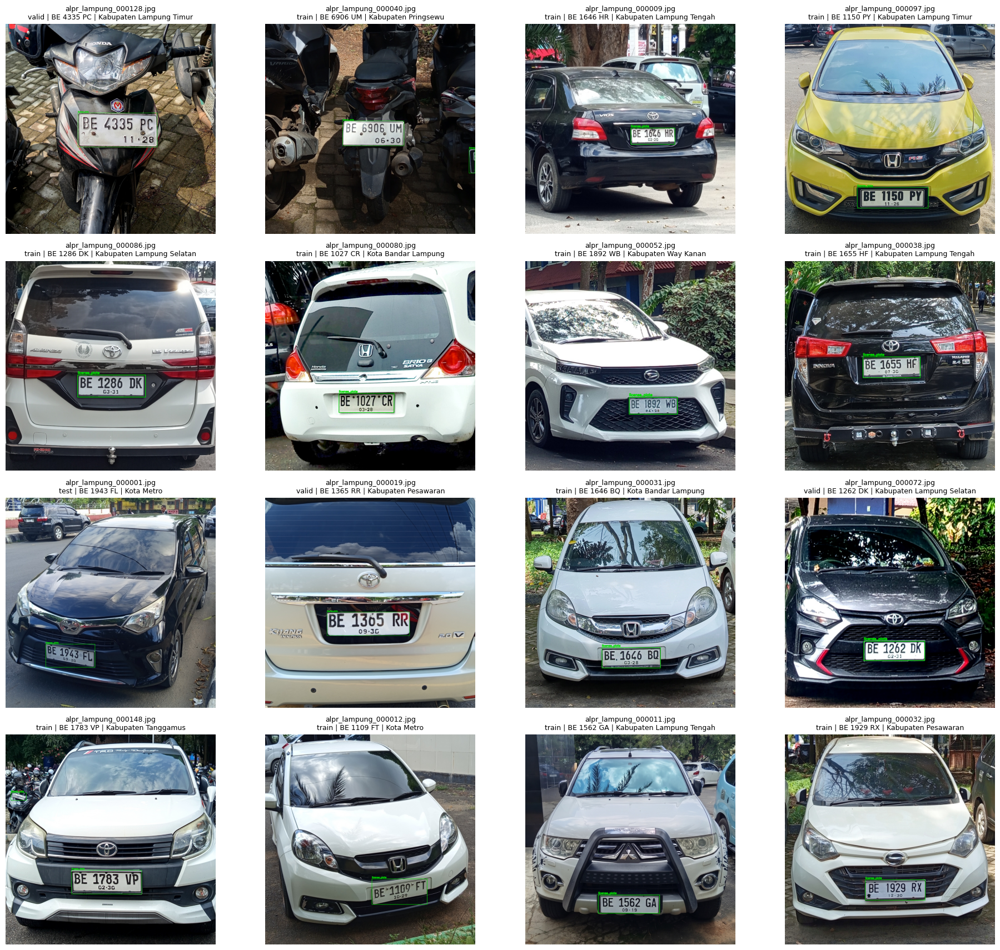

In [ ]:
def collect_dataset_samples(dataset_root: Path) -> List[Dict[str, Any]]:
    rows = []
    for split in SPLITS:
        image_dir = dataset_root / split / 'images'
        label_dir = dataset_root / split / 'labels'
        for image_path in list_files_by_ext(image_dir, IMAGE_EXTS):
            rows.append({
                'split': split,
                'image_path': image_path,
                'label_path': label_dir / f'{image_path.stem}.txt',
            })
    return rows


all_dataset_samples = collect_dataset_samples(DATASET_ROOT_PATH)
sample_count = min(len(all_dataset_samples), max(12, min(16, len(all_dataset_samples))))
sampled_rows = random.sample(all_dataset_samples, sample_count) if all_dataset_samples else []
visualize_samples(sampled_rows, gt_lookup=gt_lookup, max_cols=4)

## 11. Training YOLOv8n Baseline

Bagian ini melatih **YOLOv8n** sebagai baseline. YOLOv8n dipilih karena ringan dan cocok sebagai model awal untuk dataset kecil. Konfigurasi baseline:

- `epochs=100`,
- `imgsz=640`,
- `batch=16`,
- `patience=20`,
- `optimizer='auto'`,
- `save_period=10`,
- `plots=True`.

Jika Colab mengalami out of memory, hentikan runtime lalu turunkan `BATCH_N` dari `16` menjadi `8`. Notebook ini tidak menambahkan augmentasi ekstrem. Augmentasi bawaan YOLO boleh digunakan, tetapi untuk ALPR perlu hati-hati karena plat nomor kecil dan detail karakter penting untuk tahap OCR berikutnya.

In [ ]:
DATASET_READY = STRUCTURE_VALID and DATA_YAML_VALID and LABELS_VALID
if not DATASET_READY:
    raise RuntimeError('Dataset belum valid. Perbaiki struktur, data.yaml, atau label sebelum training.')

RUN_DIR_N = OUTPUT_ROOT_PATH / 'yolov8n_baseline'
BEST_PT_N = RUN_DIR_N / 'weights' / 'best.pt'
LAST_PT_N = RUN_DIR_N / 'weights' / 'last.pt'

if RUN_YOLOV8N:
    device_arg = 0 if (torch is not None and torch.cuda.is_available()) else 'cpu'
    if device_arg == 'cpu':
        print('Warning: CUDA tidak tersedia. Training di CPU akan sangat lambat.')

    model_n = YOLO(MODEL_N)
    train_results_n = model_n.train(
        data=DATA_YAML,
        epochs=EPOCHS,
        imgsz=IMGSZ,
        batch=BATCH_N,
        patience=PATIENCE,
        optimizer='auto',
        seed=RANDOM_SEED,
        project=OUTPUT_ROOT,
        name='yolov8n_baseline',
        exist_ok=True,
        save=True,
        save_period=10,
        plots=True,
        device=device_arg,
    )
else:
    print('RUN_YOLOV8N=False. Training YOLOv8n dilewati. Pastikan best.pt sudah tersedia jika ingin lanjut evaluasi.')

print('Run directory:', RUN_DIR_N)
print('best.pt      :', BEST_PT_N)
print('last.pt      :', LAST_PT_N)

Ultralytics 8.4.53 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/ALPR-Lampung-final/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolov8n_baseline, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, ov

## 12. Fungsi Ekstraksi dan Penyimpanan Metrik

API Ultralytics dapat berubah antar versi. Fungsi `extract_metrics()` mengambil precision, recall, mAP@0.5, dan mAP@0.5:0.95 secara aman dari object metrics, baik melalui atribut `box` maupun `results_dict`. Fungsi `save_metrics_summary()` menyimpan ringkasan metrik ke CSV dan JSON.

In [ ]:
def safe_float(value: Any) -> float:
    try:
        arr = np.asarray(value)
        if arr.size == 0:
            return float('nan')
        return float(np.nanmean(arr.astype(float)))
    except Exception:
        try:
            return float(value)
        except Exception:
            return float('nan')


def get_from_results_dict(metrics: Any, keys: List[str]) -> float:
    results_dict = getattr(metrics, 'results_dict', None)
    if not isinstance(results_dict, dict):
        return float('nan')
    for key in keys:
        if key in results_dict:
            return safe_float(results_dict[key])
    return float('nan')


def extract_metrics(metrics: Any, model_name: str, split: str, best_pt: Path) -> Dict[str, Any]:
    box = getattr(metrics, 'box', None)

    precision = safe_float(getattr(box, 'mp', np.nan)) if box is not None else float('nan')
    recall = safe_float(getattr(box, 'mr', np.nan)) if box is not None else float('nan')
    map50 = safe_float(getattr(box, 'map50', np.nan)) if box is not None else float('nan')
    map50_95 = safe_float(getattr(box, 'map', np.nan)) if box is not None else float('nan')

    if math.isnan(precision):
        precision = get_from_results_dict(metrics, ['metrics/precision(B)', 'precision'])
    if math.isnan(recall):
        recall = get_from_results_dict(metrics, ['metrics/recall(B)', 'recall'])
    if math.isnan(map50):
        map50 = get_from_results_dict(metrics, ['metrics/mAP50(B)', 'mAP50', 'map50'])
    if math.isnan(map50_95):
        map50_95 = get_from_results_dict(metrics, ['metrics/mAP50-95(B)', 'mAP50-95', 'map'])

    return {
        'model': model_name,
        'split': split,
        'precision': precision,
        'recall': recall,
        'mAP50': map50,
        'mAP50_95': map50_95,
        'best_pt': str(best_pt),
    }


def save_metrics_summary(rows: List[Dict[str, Any]], output_dir: Path) -> pd.DataFrame:
    output_dir.mkdir(parents=True, exist_ok=True)
    metrics_df = pd.DataFrame(rows)
    csv_path = output_dir / 'metrics_summary.csv'
    json_path = output_dir / 'metrics_summary.json'
    metrics_df.to_csv(csv_path, index=False)
    metrics_df.to_json(json_path, orient='records', indent=2)
    print('Metrik CSV :', csv_path)
    print('Metrik JSON:', json_path)
    return metrics_df


def copy_weights_to_drive(best_pt: Path, last_pt: Path, dataset_root: Path, model_key: str) -> Dict[str, Path]:
    target_dir = dataset_root / 'models' / model_key / 'weights'
    target_dir.mkdir(parents=True, exist_ok=True)

    copied = {}
    for source, name in [(best_pt, 'best.pt'), (last_pt, 'last.pt')]:
        if not source.exists():
            raise FileNotFoundError(f'Weight tidak ditemukan: {source}')
        target = target_dir / name
        shutil.copy2(source, target)
        copied[name] = target

    print(f'Weights {model_key} disalin ke:', target_dir)
    return copied

## 13. Evaluasi YOLOv8n pada Validation Set

Setelah training, model terbaik `best.pt` diload ulang dan dievaluasi pada split validation. Metrik utama yang ditampilkan adalah precision, recall, mAP@0.5, dan mAP@0.5:0.95.

In [ ]:
if not BEST_PT_N.exists():
    raise FileNotFoundError(f'best.pt YOLOv8n tidak ditemukan: {BEST_PT_N}. Jalankan training YOLOv8n terlebih dahulu.')

best_model_n = YOLO(str(BEST_PT_N))
metrics_val_n = best_model_n.val(data=DATA_YAML, split='val', imgsz=IMGSZ)
metrics_row_val_n = extract_metrics(metrics_val_n, 'yolov8n', 'val', BEST_PT_N)

display(pd.DataFrame([metrics_row_val_n]))

Ultralytics 8.4.53 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 73 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.4±0.1 ms, read: 197.7±63.8 MB/s, size: 552.5 KB)
val: Scanning /content/drive/MyDrive/ALPR-Lampung-final/valid/labels.cache... 36 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 36/36 13.7Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.4it/s 2.2s
                   all         36         36      0.998          1      0.995      0.933
Speed: 8.5ms preprocess, 11.8ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to /content/runs/detect/val


,model,split,precision,recall,mAP50,mAP50_95,best_pt
0,yolov8n,val,0.998051,1.0,0.995,0.932866,/content/drive/MyDrive/ALPR-Lampung-training-r...


## 14. Evaluasi YOLOv8n pada Test Set dan Simpan Metrik

Cell ini mengevaluasi `best.pt` pada test set. Karena test set hanya 12 gambar, metrik test perlu dibaca hati-hati. Gunakan metrik test bersama hasil visual prediksi untuk menilai apakah model cukup layak dipakai pada Pipeline A.

In [ ]:
metrics_test_n = best_model_n.val(data=DATA_YAML, split='test', imgsz=IMGSZ)
metrics_row_test_n = extract_metrics(metrics_test_n, 'yolov8n', 'test', BEST_PT_N)

metrics_rows_n = [metrics_row_val_n, metrics_row_test_n]
metrics_n_df = save_metrics_summary(metrics_rows_n, RUN_DIR_N)
display(metrics_n_df)

Ultralytics 8.4.53 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
val: Fast image access ✅ (ping: 0.4±0.1 ms, read: 57.8±121.0 MB/s, size: 1114.6 KB)
val: Scanning /content/drive/MyDrive/ALPR-Lampung-final/test/labels... 12 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 12/12 4.4it/s 2.7s
val: New cache created: /content/drive/MyDrive/ALPR-Lampung-final/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 1.9s/it 1.9s
                   all         12         12      0.995          1      0.995      0.928
Speed: 1.9ms preprocess, 16.2ms inference, 0.0ms loss, 2.8ms postprocess per image
Results saved to /content/runs/detect/val-2
Metrik CSV : /content/drive/MyDrive/ALPR-Lampung-training-runs/yolov8n_baseline/metrics_summary.csv
Metrik JSON: /content/drive/MyDrive/ALPR-Lampung-training-runs/yolov8n_baseline/metrics_summary.json


,model,split,precision,recall,mAP50,mAP50_95,best_pt
0,yolov8n,val,0.998051,1.0,0.995,0.932866,/content/drive/MyDrive/ALPR-Lampung-training-r...
1,yolov8n,test,0.995487,1.0,0.995,0.928417,/content/drive/MyDrive/ALPR-Lampung-training-r...


## 15. Visualisasi Prediksi YOLOv8n pada Test Set

Cell ini mengambil 12 sampai 20 gambar dari `test/images`, menjalankan prediksi menggunakan `best.pt`, menampilkan bounding box prediksi, dan menyimpan hasil prediksi ke:

```text
/content/drive/MyDrive/ALPR-Lampung-training-runs/yolov8n_baseline/test_predictions/
```

Judul gambar berisi filename, confidence maksimum, dan jumlah deteksi. Jika gambar memiliki lebih dari satu deteksi, periksa secara visual apakah deteksi tambahan tersebut benar atau false positive.


0: 640x640 1 license_plate, 4.8ms
1: 640x640 1 license_plate, 4.8ms
2: 640x640 1 license_plate, 4.8ms
3: 640x640 1 license_plate, 4.8ms
4: 640x640 1 license_plate, 4.8ms
5: 640x640 1 license_plate, 4.8ms
6: 640x640 1 license_plate, 4.8ms
7: 640x640 1 license_plate, 4.8ms
8: 640x640 2 license_plates, 4.8ms
9: 640x640 1 license_plate, 4.8ms
10: 640x640 1 license_plate, 4.8ms
11: 640x640 1 license_plate, 4.8ms
Speed: 3.1ms preprocess, 4.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /content/drive/MyDrive/ALPR-Lampung-training-runs/yolov8n_baseline/test_predictions


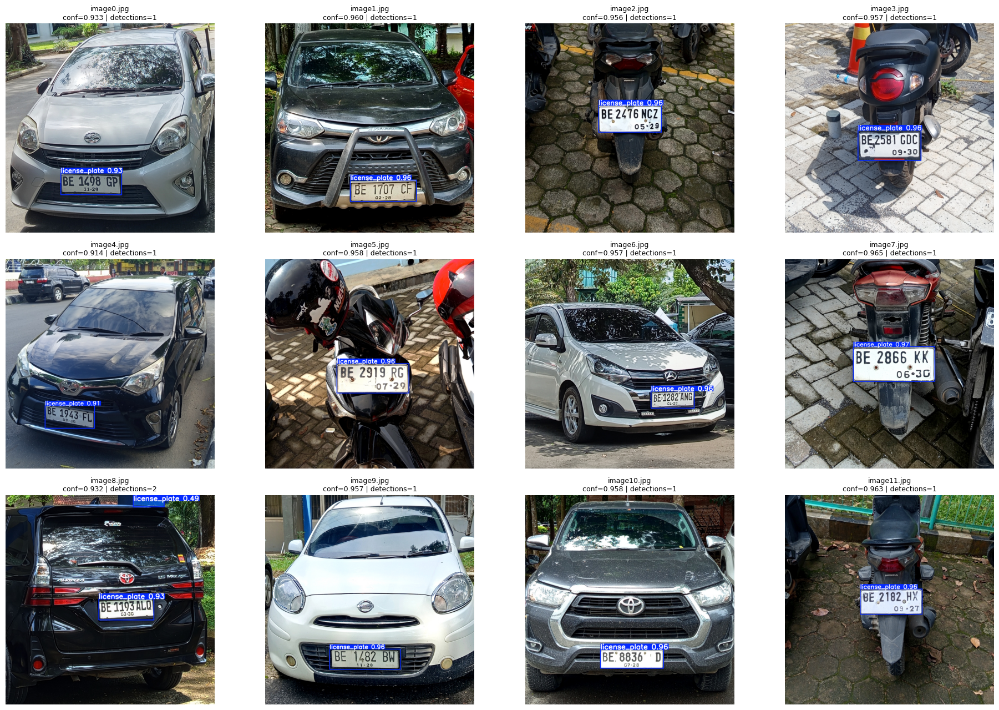

Folder prediksi test: /content/drive/MyDrive/ALPR-Lampung-training-runs/yolov8n_baseline/test_predictions


In [ ]:
def visualize_prediction_results(results: List[Any], max_cols: int = 4):
    if not results:
        print('Tidak ada hasil prediksi untuk divisualisasikan.')
        return

    cols = min(max_cols, len(results))
    rows = math.ceil(len(results) / cols)
    fig, axes = plt.subplots(rows, cols, figsize=(4.8 * cols, 4.3 * rows))
    axes = np.array(axes).reshape(-1)

    for ax, result in zip(axes, results):
        plotted_bgr = result.plot()
        plotted_rgb = cv2.cvtColor(plotted_bgr, cv2.COLOR_BGR2RGB)
        image_name = Path(result.path).name
        num_det = len(result.boxes) if result.boxes is not None else 0
        conf_values = result.boxes.conf.detach().cpu().numpy().tolist() if num_det > 0 else []
        max_conf = max(conf_values) if conf_values else 0.0

        ax.imshow(plotted_rgb)
        ax.set_title(f'{image_name}\nconf={max_conf:.3f} | detections={num_det}', fontsize=9)
        ax.axis('off')

    for ax in axes[len(results):]:
        ax.axis('off')

    plt.tight_layout()
    plt.show()


test_image_dir = DATASET_ROOT_PATH / 'test' / 'images'
test_images = list_files_by_ext(test_image_dir, IMAGE_EXTS)
if len(test_images) == 0:
    raise FileNotFoundError(f'Tidak ada gambar test pada {test_image_dir}')

prediction_count = min(len(test_images), max(12, min(len(test_images), 16)))
prediction_images = random.sample(test_images, prediction_count)

prediction_results_n = best_model_n.predict(
    source=[str(p) for p in prediction_images],
    imgsz=IMGSZ,
    conf=CONF_THRES,
    save=True,
    project=str(RUN_DIR_N),
    name='test_predictions',
    exist_ok=True,
)

visualize_prediction_results(prediction_results_n, max_cols=4)
print('Folder prediksi test:', RUN_DIR_N / 'test_predictions')

## 16. Salin Weight YOLOv8n ke Folder Dataset Final

Agar model terbaik mudah ditemukan oleh notebook berikutnya, `best.pt` dan `last.pt` disalin ke:

```text
/content/drive/MyDrive/ALPR-Lampung-final/models/yolov8n/weights/
```

Folder model ini tidak mengubah image, label, atau split dataset final.

In [ ]:
copied_weights_n = copy_weights_to_drive(BEST_PT_N, LAST_PT_N, DATASET_ROOT_PATH, 'yolov8n')
for name, path in copied_weights_n.items():
    print(name, '->', path)

Weights yolov8n disalin ke: /content/drive/MyDrive/ALPR-Lampung-final/models/yolov8n/weights
best.pt -> /content/drive/MyDrive/ALPR-Lampung-final/models/yolov8n/weights/best.pt
last.pt -> /content/drive/MyDrive/ALPR-Lampung-final/models/yolov8n/weights/last.pt


## 17. Opsional Training YOLOv8s

YOLOv8s dapat dijalankan sebagai pembanding jika waktu dan GPU mencukupi. Secara default `RUN_YOLOV8S=False`, sehingga section ini tidak otomatis menjalankan training. Untuk menjalankannya, ubah flag menjadi `True` pada cell konfigurasi awal lalu jalankan ulang dari bagian training.

YOLOv8s lebih besar daripada YOLOv8n. Jika terjadi out of memory, gunakan `BATCH_S=8` atau lebih kecil.

In [ ]:
RUN_DIR_S = OUTPUT_ROOT_PATH / 'yolov8s_baseline'
BEST_PT_S = RUN_DIR_S / 'weights' / 'best.pt'
LAST_PT_S = RUN_DIR_S / 'weights' / 'last.pt'
metrics_s_df = pd.DataFrame()

if RUN_YOLOV8S:
    device_arg = 0 if (torch is not None and torch.cuda.is_available()) else 'cpu'
    if device_arg == 'cpu':
        print('Warning: CUDA tidak tersedia. Training di CPU akan sangat lambat.')

    model_s = YOLO(MODEL_S)
    train_results_s = model_s.train(
        data=DATA_YAML,
        epochs=EPOCHS,
        imgsz=IMGSZ,
        batch=BATCH_S,
        patience=PATIENCE,
        optimizer='auto',
        seed=RANDOM_SEED,
        project=OUTPUT_ROOT,
        name='yolov8s_baseline',
        exist_ok=True,
        save=True,
        save_period=10,
        plots=True,
        device=device_arg,
    )

    best_model_s = YOLO(str(BEST_PT_S))
    metrics_val_s = best_model_s.val(data=DATA_YAML, split='val', imgsz=IMGSZ)
    metrics_test_s = best_model_s.val(data=DATA_YAML, split='test', imgsz=IMGSZ)

    metrics_rows_s = [
        extract_metrics(metrics_val_s, 'yolov8s', 'val', BEST_PT_S),
        extract_metrics(metrics_test_s, 'yolov8s', 'test', BEST_PT_S),
    ]
    metrics_s_df = save_metrics_summary(metrics_rows_s, RUN_DIR_S)
    copy_weights_to_drive(BEST_PT_S, LAST_PT_S, DATASET_ROOT_PATH, 'yolov8s')
    display(metrics_s_df)
else:
    print('RUN_YOLOV8S=False. Training YOLOv8s dilewati.')

RUN_YOLOV8S=False. Training YOLOv8s dilewati.


## 18. Perbandingan Model

Jika YOLOv8s dijalankan, tabel ini membandingkan YOLOv8n dan YOLOv8s pada validation dan test set. Jika hanya YOLOv8n dijalankan, tabel tetap menampilkan ringkasan YOLOv8n saja.

In [ ]:
comparison_frames = [metrics_n_df]
if RUN_YOLOV8S and len(metrics_s_df) > 0:
    comparison_frames.append(metrics_s_df)

comparison_df = pd.concat(comparison_frames, ignore_index=True)
comparison_path = OUTPUT_ROOT_PATH / 'model_comparison.csv'
comparison_df.to_csv(comparison_path, index=False)

print('Model comparison CSV:', comparison_path)
display(comparison_df[['model', 'split', 'precision', 'recall', 'mAP50', 'mAP50_95', 'best_pt']])

Model comparison CSV: /content/drive/MyDrive/ALPR-Lampung-training-runs/model_comparison.csv


,model,split,precision,recall,mAP50,mAP50_95,best_pt
0,yolov8n,val,0.998051,1.0,0.995,0.932866,/content/drive/MyDrive/ALPR-Lampung-training-r...
1,yolov8n,test,0.995487,1.0,0.995,0.928417,/content/drive/MyDrive/ALPR-Lampung-training-r...


## 19. Analisis Hasil Training

Beberapa metrik utama yang perlu dibaca:

- **Precision** mengukur seberapa banyak prediksi model yang benar. Precision rendah berarti model sering mendeteksi objek selain plat atau membuat false positive.
- **Recall** mengukur seberapa banyak plat asli yang berhasil ditemukan. Recall rendah berarti model sering melewatkan plat, dan ini berbahaya untuk pipeline OCR karena plat yang tidak terdeteksi tidak akan pernah dibaca oleh PaddleOCR.
- **mAP@0.5** mengukur kualitas deteksi dengan ambang IoU 0.5. Nilai tinggi menunjukkan model cukup baik menemukan objek dengan overlap yang masuk akal.
- **mAP@0.5:0.95** lebih ketat karena menghitung rata-rata mAP pada banyak ambang IoU. Nilai ini penting untuk melihat apakah bounding box model presisi, bukan hanya sekadar mengenai area plat.

Untuk ALPR, deteksi yang baik bukan hanya soal angka metrik. Bounding box perlu cukup rapat mengelilingi plat agar crop yang masuk ke OCR tidak terlalu banyak membawa background, tetapi juga tidak memotong karakter plat. Karena dataset hanya 185 gambar dan test set hanya 12 gambar, evaluasi visual tetap wajib dilakukan.

## 20. Ringkasan Akhir dan Rekomendasi Pipeline A

Cell terakhir merangkum lokasi output penting dan memberikan rekomendasi awal apakah model layak dilanjutkan ke Pipeline A: YOLO crop + PaddleOCR. Keputusan akhir tetap perlu mempertimbangkan visualisasi prediksi test, bukan metrik saja.

In [ ]:
summary_metric_row = comparison_df[(comparison_df['model'] == 'yolov8n') & (comparison_df['split'] == 'test')]
if len(summary_metric_row) == 0:
    summary_metric_row = comparison_df[(comparison_df['model'] == 'yolov8n') & (comparison_df['split'] == 'val')]

if len(summary_metric_row) > 0:
    row = summary_metric_row.iloc[0]
    map50 = row['mAP50']
    recall = row['recall']
    precision = row['precision']
else:
    map50 = recall = precision = float('nan')

print('Dataset final              :', DATASET_ROOT_PATH)
print('data.yaml                  :', DATA_YAML_PATH)
print('Training runs              :', OUTPUT_ROOT_PATH)
print('YOLOv8n best.pt            :', BEST_PT_N)
print('YOLOv8n last.pt            :', LAST_PT_N)
print('YOLOv8n copied best.pt     :', copied_weights_n.get('best.pt'))
print('Metrics summary YOLOv8n    :', RUN_DIR_N / 'metrics_summary.csv')
print('Prediksi test YOLOv8n      :', RUN_DIR_N / 'test_predictions')
print('Comparison table           :', comparison_path)
print()
print('Jumlah dataset final:')
display(structure_df)
print()

print('Rekomendasi:')
print('- Jika mAP@0.5 tinggi dan prediksi visual bagus, lanjut ke Pipeline A YOLO crop + PaddleOCR.')
print('- Jika recall rendah, cek ulang label/bbox dan pertimbangkan menambah data karena model masih melewatkan plat.')
print('- Jika precision rendah, cek apakah model sering mendeteksi objek selain plat.')
print('- Jika bbox terlalu longgar atau terlalu ketat, cek kualitas label hasil konversi dan hasil prediksi visual.')
print('- Jika hasil test tidak stabil, ingat bahwa test set hanya 12 gambar sehingga metrik test mudah berubah.')

ready_signal = (
    not math.isnan(map50) and not math.isnan(recall) and not math.isnan(precision) and
    map50 >= 0.80 and recall >= 0.80 and precision >= 0.80
)

print()
if ready_signal:
    print('Kesimpulan awal: model YOLOv8n tampak layak secara metrik untuk dicoba pada Pipeline A, dengan syarat visualisasi prediksi test juga terlihat baik.')
else:
    print('Kesimpulan awal: baca hasil dengan hati-hati. Periksa visualisasi prediksi test sebelum memakai model untuk Pipeline A.')

Dataset final              : /content/drive/MyDrive/ALPR-Lampung-final
data.yaml                  : /content/drive/MyDrive/ALPR-Lampung-final/data.yaml
Training runs              : /content/drive/MyDrive/ALPR-Lampung-training-runs
YOLOv8n best.pt            : /content/drive/MyDrive/ALPR-Lampung-training-runs/yolov8n_baseline/weights/best.pt
YOLOv8n last.pt            : /content/drive/MyDrive/ALPR-Lampung-training-runs/yolov8n_baseline/weights/last.pt
YOLOv8n copied best.pt     : /content/drive/MyDrive/ALPR-Lampung-final/models/yolov8n/weights/best.pt
Metrics summary YOLOv8n    : /content/drive/MyDrive/ALPR-Lampung-training-runs/yolov8n_baseline/metrics_summary.csv
Prediksi test YOLOv8n      : /content/drive/MyDrive/ALPR-Lampung-training-runs/yolov8n_baseline/test_predictions
Comparison table           : /content/drive/MyDrive/ALPR-Lampung-training-runs/model_comparison.csv

Jumlah dataset final:


,split,images,labels,status
0,train,137,137,OK
1,valid,36,36,OK
2,test,12,12,OK



Rekomendasi:
- Jika mAP@0.5 tinggi dan prediksi visual bagus, lanjut ke Pipeline A YOLO crop + PaddleOCR.
- Jika recall rendah, cek ulang label/bbox dan pertimbangkan menambah data karena model masih melewatkan plat.
- Jika precision rendah, cek apakah model sering mendeteksi objek selain plat.
- Jika bbox terlalu longgar atau terlalu ketat, cek kualitas label hasil konversi dan hasil prediksi visual.
- Jika hasil test tidak stabil, ingat bahwa test set hanya 12 gambar sehingga metrik test mudah berubah.

Kesimpulan awal: model YOLOv8n tampak layak secara metrik untuk dicoba pada Pipeline A, dengan syarat visualisasi prediksi test juga terlihat baik.
